In [2]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/tyre-quality-classification/Digital images of defective and good condition tyres/good/good (226).jpg
/kaggle/input/tyre-quality-classification/Digital images of defective and good condition tyres/good/good (432).jpg
/kaggle/input/tyre-quality-classification/Digital images of defective and good condition tyres/good/good (490).jpg
/kaggle/input/tyre-quality-classification/Digital images of defective and good condition tyres/good/good (422).jpg
/kaggle/input/tyre-quality-classification/Digital images of defective and good condition tyres/good/good (361).jpg
/kaggle/input/tyre-quality-classification/Digital images of defective and good condition tyres/good/good (220).jpg
/kaggle/input/tyre-quality-classification/Digital images of defective and good condition tyres/good/good (406).jpg
/kaggle/input/tyre-quality-classification/Digital images of defective and good condition tyres/good/good (681).jpg
/kaggle/input/tyre-quality-classification/Digital images of defective and good c

In [3]:
import pandas as pd
import os
import numpy as np
import seaborn as sns 
import tensorflow as tf
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score,precision_score,recall_score,f1_score,ConfusionMatrixDisplay,classification_report

2024-04-19 09:24:02.896828: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-19 09:24:02.896920: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-19 09:24:03.044328: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [4]:
good_images="/kaggle/input/tyre-quality-classification/Digital images of defective and good condition tyres/good"
defective_images="/kaggle/input/tyre-quality-classification/Digital images of defective and good condition tyres/defective"

In [5]:
defective_ones= os.listdir(defective_images)
defective_ones=len(defective_ones)
print(f"No. of Defective Tyres images:{defective_ones}")
good_ones= os.listdir(good_images)
good_ones=len(good_ones)
print(f"No. of Good Tyres images:{good_ones}")

No. of Defective Tyres images:1028
No. of Good Tyres images:828


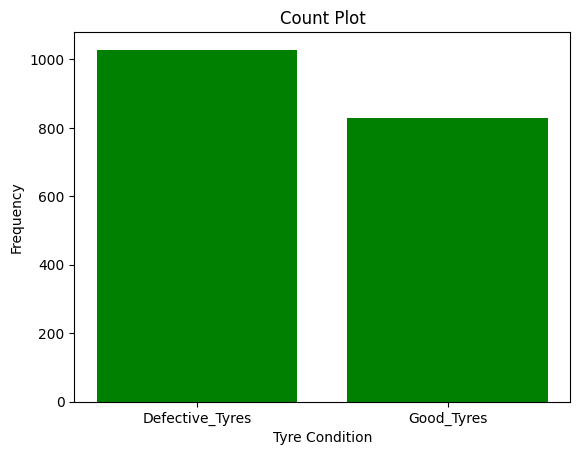

In [6]:
data = [defective_ones, good_ones]
labels = ["Defective_Tyres", "Good_Tyres"]

plt.bar(labels,data,color='g')
plt.xlabel("Tyre Condition")
plt.ylabel("Frequency")
plt.title("Count Plot")
plt.show()

In [7]:
image_directory="/kaggle/input/tyre-quality-classification/Digital images of defective and good condition tyres"
img_width=224
img_height=224

train_data = tf.keras.utils.image_dataset_from_directory(image_directory,
                                                         validation_split=0.2,
                                                         seed=123,
                                                         subset="training",
                                                         image_size=(img_height, img_width),
                                                         batch_size=32)

Found 1856 files belonging to 2 classes.
Using 1485 files for training.


In [8]:
class_names=train_data.class_names
print(class_names)

['defective', 'good']


In [9]:
val_data = tf.keras.utils.image_dataset_from_directory(image_directory,
                                                       validation_split=0.2,
                                                       seed=123,
                                                       subset="validation",
                                                       image_size=(img_height, img_width),
                                                       batch_size=32)

Found 1856 files belonging to 2 classes.
Using 371 files for validation.


In [10]:
for image, label in train_data.take(1):
    print(f"Shape of Images with batch_size:{image.shape}")
    print(f"Total no. of labels contain in one batch:{label.shape}")
    print(f"Check the single image in form of tensors:{image[0]}")
    print(f"Label:{class_names[label[0]]}")

Shape of Images with batch_size:(32, 224, 224, 3)
Total no. of labels contain in one batch:(32,)
Check the single image in form of tensors:[[[ 56.584343  56.584343  48.584343]
  [ 59.19061   58.19061   53.19061 ]
  [ 47.71429   47.71429   39.71429 ]
  ...
  [ 85.22117   88.22117   80.91746 ]
  [106.38693  114.38693  101.38693 ]
  [118.19832  126.000084 110.887886]]

 [[ 57.717316  56.717316  51.717316]
  [ 43.053574  42.053574  37.053574]
  [ 50.143253  49.143253  44.143253]
  ...
  [ 84.15813   87.15813   76.15813 ]
  [107.49112  115.49112  100.49112 ]
  [113.71752  121.71752  106.71752 ]]

 [[ 48.426502  49.426502  43.426502]
  [ 47.24729   48.24729   42.24729 ]
  [ 51.28053   52.28053   46.28053 ]
  ...
  [ 87.01703   90.01703   79.01703 ]
  [106.964355 114.964355 101.964355]
  [111.05638  119.05638  106.05638 ]]

 ...

 [[ 85.121025  76.121025  69.121025]
  [ 98.16408   87.16408   81.16408 ]
  [ 96.96027   85.96027   79.96027 ]
  ...
  [ 42.082676  44.082676  39.082676]
  [ 44.7557

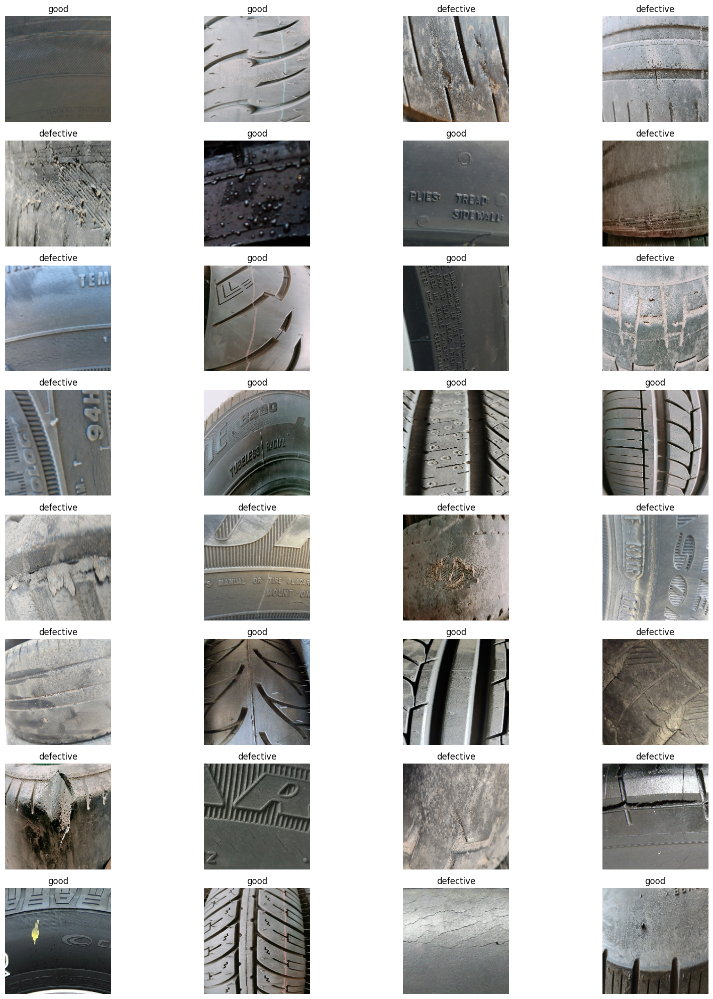

In [11]:
plt.figure(figsize=(20,20), tight_layout=True, facecolor="white")
for image, label in train_data.take(1):
    for i in range(32):
        ax=plt.subplot(8, 4, i+1)
        plt.imshow(image[i].numpy().astype("uint8"))
        plt.title(class_names[label[i]])
        plt.axis("off")

In [12]:
# Create base model with tf.keras.applications
base_model =tf.keras.applications.resnet.ResNet50(include_top=False)

# Freeze the base model (so the pre-learned patterns remain same)
base_model.trainable = False

# Create inputs into the base model
inputs = tf.keras.layers.Input(shape=(224, 224, 3), name="input_layer")
x = base_model(inputs)

# Check data shape after passing it to base_model
print(f"Shape after base_model: {x.shape}")

# Average pool the outputs of the base model (aggregate all the most important information, reduce number of computations)
x = tf.keras.layers.GlobalAveragePooling2D(name="global_average_pooling_layer")(x)

x=tf.keras.layers.Flatten()(x)
x=tf.keras.layers.Dense(512, activation="relu")(x)
#x=tf.keras.layers.Dropout(0.5)(x)

# Create the output activation layer
outputs=tf.keras.layers.Dense(1, activation="sigmoid",name="output_layer")(x)

# Combine the inputs with the outputs into a model
model= tf.keras.Model(inputs, outputs, name="model")

# Compile the model
model.compile(loss=tf.keras.losses.BinaryCrossentropy(),   # different loss function for Binary classifcation
              optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
              metrics=["accuracy"]
             )

# Callbacks--> Stop training automatically once the model performance stop improving
learning_rate_reduction=tf.keras.callbacks.ReduceLROnPlateau(monitor="val_loss",patience=2,factor=0.5, min_lr=0.00001,verbose =1)
Early_Stopping= tf.keras.callbacks.EarlyStopping(monitor="val_loss",patience=5, restore_best_weights=True)

# Fit the model
history1= model.fit(train_data, epochs=5, validation_data=val_data, callbacks=[Early_Stopping,learning_rate_reduction], verbose=1)

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step
Shape after base_model: (None, 7, 7, 2048)
Epoch 1/5
 2/47 ━━━━━━━━━━━━━━━━━━━━ 4s 92ms/step - accuracy: 0.4297 - loss: 1.7551  

I0000 00:00:1713518698.572182      98 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
W0000 00:00:1713518698.618859      98 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 639ms/step - accuracy: 0.7111 - loss: 0.9335

W0000 00:00:1713518728.027603      95 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update
W0000 00:00:1713518737.188225      95 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update
W0000 00:00:1713518744.356956      98 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


47/47 ━━━━━━━━━━━━━━━━━━━━ 67s 1s/step - accuracy: 0.7132 - loss: 0.9250 - val_accuracy: 0.9353 - val_loss: 0.1990 - learning_rate: 0.0010
Epoch 2/5
47/47 ━━━━━━━━━━━━━━━━━━━━ 27s 496ms/step - accuracy: 0.9517 - loss: 0.1386 - val_accuracy: 0.9407 - val_loss: 0.1674 - learning_rate: 0.0010
Epoch 3/5
47/47 ━━━━━━━━━━━━━━━━━━━━ 28s 514ms/step - accuracy: 0.9830 - loss: 0.0771 - val_accuracy: 0.9326 - val_loss: 0.1608 - learning_rate: 0.0010
Epoch 4/5
47/47 ━━━━━━━━━━━━━━━━━━━━ 28s 513ms/step - accuracy: 0.9859 - loss: 0.0535 - val_accuracy: 0.9515 - val_loss: 0.1285 - learning_rate: 0.0010
Epoch 5/5
47/47 ━━━━━━━━━━━━━━━━━━━━ 28s 511ms/step - accuracy: 0.9944 - loss: 0.0236 - val_accuracy: 0.9515 - val_loss: 0.1249 - learning_rate: 0.0010


In [13]:
model.summary()

Model: "model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ resnet50 (Functional)           │ (None, 7, 7, 2048)     │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling_layer    │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │     1,049,088 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output_layer (Dense)            │ (None, 1)              │           513 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 26,736,517 (101.99 MB)

 Trainable params: 1,049,601 (4.00 MB)

 Non-trainable params: 23,587,712 (89.98 MB)

 Optimizer params: 2,099,204 (8.01 MB)

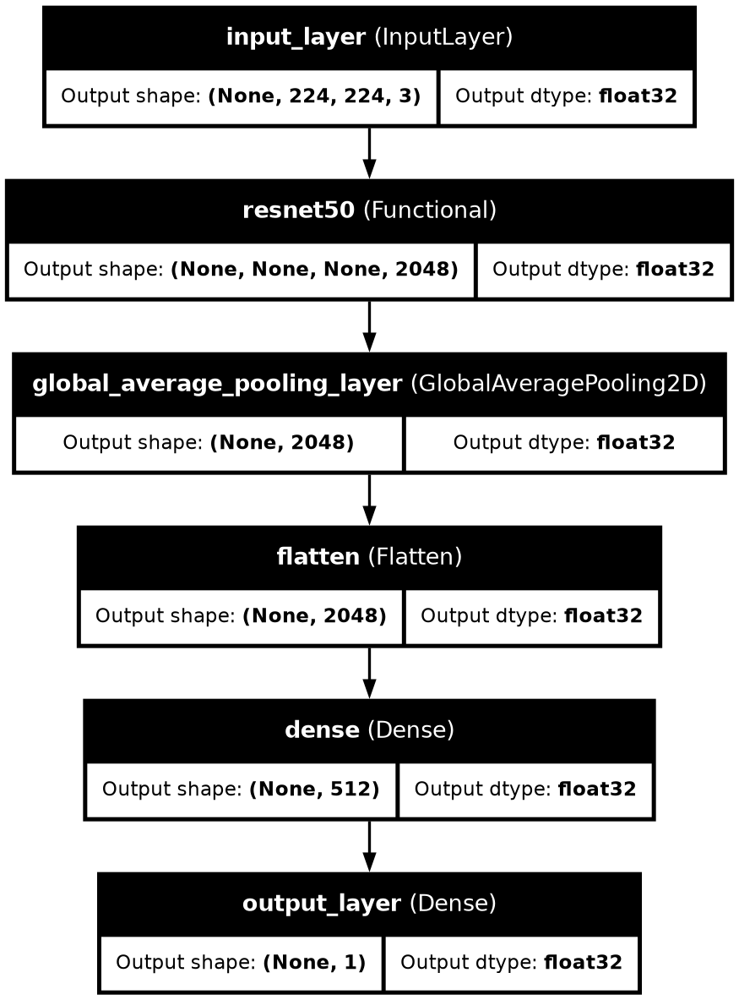

In [14]:
tf.keras.utils.plot_model(model, show_shapes=True, show_layer_names=True, show_dtype=True, dpi=120)

In [15]:
dataframe=pd.DataFrame(history1.history)
dataframe

,accuracy,loss,val_accuracy,val_loss,learning_rate
0,0.813468,0.526283,0.935310,0.199029,0.001
1,0.949495,0.134812,0.940701,0.167367,0.001
2,0.978451,0.076819,0.932615,0.160818,0.001
3,0.988552,0.045681,0.951482,0.128475,0.001
4,0.995960,0.024959,0.951482,0.124919,0.001


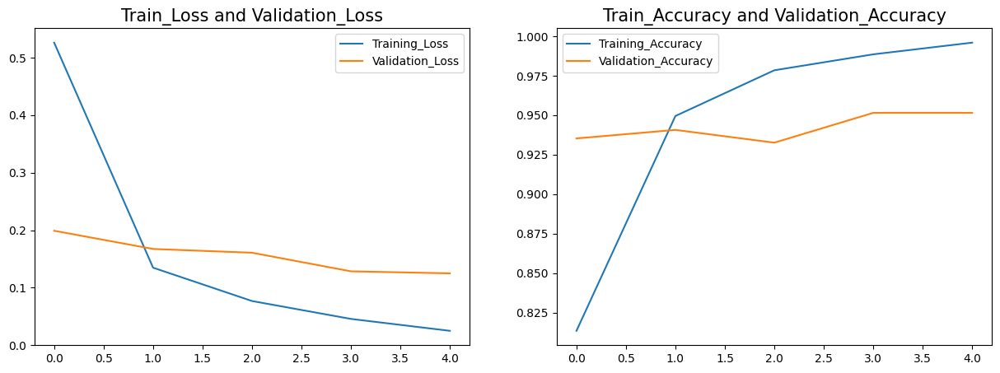

In [16]:
plt.figure(figsize=(15,5))

plt.subplot(1,2,1)
plt.plot(dataframe["loss"], label="Training_Loss")
plt.plot(dataframe["val_loss"], label="Validation_Loss")
plt.title('Train_Loss and Validation_Loss',fontsize=15)
plt.legend()

plt.subplot(1,2,2)
plt.plot(dataframe["accuracy"], label="Training_Accuracy")
plt.plot(dataframe["val_accuracy"], label="Validation_Accuracy")
plt.title('Train_Accuracy and Validation_Accuracy',fontsize=15)
plt.legend()
plt.show()

In [17]:
loss, accuracy=model.evaluate(val_data)
print(f"Accuracy:{accuracy}")
print(f"Loss:{loss}")

12/12 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - accuracy: 0.9335 - loss: 0.1586
Accuracy:0.9514824748039246
Loss:0.12491927295923233


In [18]:
x_val=[]
y_val=[]
for image, label in val_data:
    x_val.extend(image.numpy())
    y_val.extend(label.numpy()) 

In [19]:
# Lets make the Predictions
predictions=model.predict(np.array(x_val))
y_pred=[int(np.round(prediction)) for prediction in predictions]

 3/12 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step

W0000 00:00:1713519139.247409      96 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


12/12 ━━━━━━━━━━━━━━━━━━━━ 8s 425ms/step


W0000 00:00:1713519143.922284      96 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update
/tmp/ipykernel_34/3206627562.py:3: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_pred=[int(np.round(prediction)) for prediction in predictions]


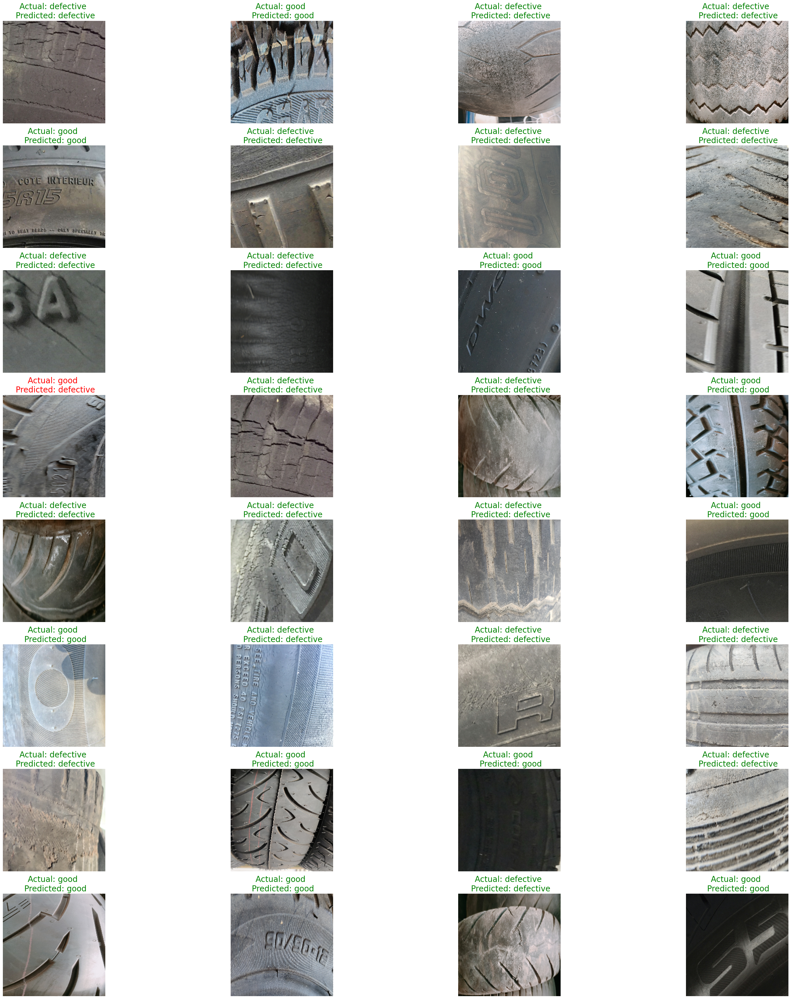

In [20]:
plt.figure(figsize=(35, 35),tight_layout=True, facecolor="white")

for i in range(32):
    ax = plt.subplot(8, 4, i + 1)
    plt.imshow(x_val[i].astype("uint8"))
    actual_label = class_names[y_val[i]]
    predicted_label = class_names[y_pred[i]]
    
    # Check if the actual and predicted labels are the same
    if actual_label == predicted_label:
        label_color ='green'
    else:
        label_color = 'red'
    
    plt.title(f'Actual: {actual_label} \n Predicted: {predicted_label}', color=label_color,fontsize=20)
    plt.axis("off")
plt.show()

F1-Score:[0.9507580226521944]
Precision:[0.9520703933747412]
Recall:[0.9496763754045308]
Classification_Report
              precision    recall  f1-score   support

           0       0.97      0.95      0.96       210
           1       0.93      0.96      0.94       161

    accuracy                           0.95       371
   macro avg       0.95      0.95      0.95       371
weighted avg       0.95      0.95      0.95       371

Confusion_Matrix


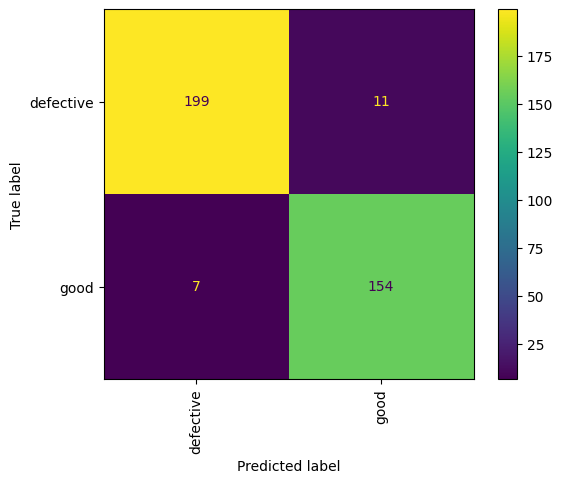

In [21]:
f1_scores=[]
precision_scores=[]
recall_scores=[]

f1_scores.append(f1_score(y_pred, y_val, average="macro"))
precision_scores.append(precision_score(y_pred, y_val, average="macro"))
recall_scores.append(recall_score(y_pred, y_val, average="macro"))

# Print the Results
print(f"F1-Score:{f1_scores}")
print(f"Precision:{precision_scores}")
print(f"Recall:{recall_scores}")

print("Classification_Report")
print(classification_report(y_val,y_pred))
print("Confusion_Matrix")
ConfusionMatrixDisplay.from_predictions(y_val, y_pred, display_labels=class_names, xticks_rotation="vertical")
plt.show()

In [22]:
model_name=["ResNet50"]
result_df= pd.DataFrame({"F1_Score":f1_scores, "Precision_Score":precision_scores, "Recall_Score":recall_scores}, index=model_name)
result_df= result_df.T.sort_values(by="ResNet50", ascending=False)
result_df

,ResNet50
Precision_Score,0.952070
F1_Score,0.950758
Recall_Score,0.949676


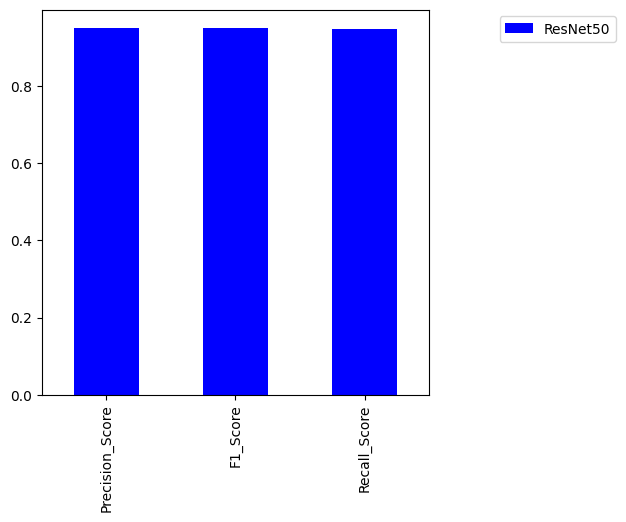

In [25]:
result_df.plot(kind="bar",figsize=(5,5), color="b").legend(bbox_to_anchor=(1.5,1))